<a href="https://colab.research.google.com/github/earthspecies/latent_macaque/blob/master/macaque_calls_avgn_umap.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%tensorflow_version 2.x

TensorFlow 2.x selected.


In [2]:
!git clone https://github.com/timsainb/avgn_paper.git

Cloning into 'avgn_paper'...
remote: Enumerating objects: 73, done.
remote: Counting objects: 100% (73/73), done.
remote: Compressing objects: 100% (60/60), done.
remote: Total 2093 (delta 20), reused 57 (delta 13), pack-reused 2020
Receiving objects: 100% (2093/2093), 2.02 GiB | 42.19 MiB/s, done.
Resolving deltas: 100% (591/591), done.
Checking out files: 100% (1201/1201), done.


In [3]:
cd avgn_paper

/content/avgn_paper


In [4]:
!python setup.py develop

running develop
running egg_info
creating avgn.egg-info
writing avgn.egg-info/PKG-INFO
writing dependency_links to avgn.egg-info/dependency_links.txt
writing top-level names to avgn.egg-info/top_level.txt
writing manifest file 'avgn.egg-info/SOURCES.txt'
writing manifest file 'avgn.egg-info/SOURCES.txt'
running build_ext
Creating /usr/local/lib/python3.6/dist-packages/avgn.egg-link (link to .)
Adding avgn 0.2.0 to easy-install.pth file

Installed /content/avgn_paper
Processing dependencies for avgn==0.2.0
Finished processing dependencies for avgn==0.2.0


In [0]:
# !gsutil cp gs://ml-animal-sounds-datasets/Fukushima2015.pickle .

In [0]:
%matplotlib inline

import pathlib
import pandas as pd
import numpy as np
import librosa, librosa.display
import warnings
import matplotlib.pyplot as plt

In [8]:
!pip install pathlib2

In [9]:
!pip install hparams

In [10]:
from librosa.core.time_frequency import mel_frequencies
from avgn.signalprocessing.spectrogramming_tf import spectrogram_tensorflow
from avgn.utils.audio import load_wav, float32_to_int16, int16_to_float32, write_wav
from avgn.visualization.spectrogram import visualize_spec, plot_spec
from avgn.utils.hparams import HParams
from avgn.signalprocessing.filtering import butter_bandpass_filter

/usr/local/lib/python3.6/dist-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [11]:
!gsutil cp gs://ml-animal-sounds-datasets/Fukushima2015.zip .

Copying gs://ml-animal-sounds-datasets/Fukushima2015.zip...
\ [1 files][126.0 MiB/126.0 MiB]                                                
Operation completed over 1 objects/126.0 MiB.                                    


In [0]:
%%capture
!unzip Fukushima2015.zip

In [0]:
from pathlib import Path
import pandas as pd

In [0]:
wav_gen = Path('dataupload').glob('*/*.wav')

In [0]:
from scipy.io.wavfile import read

In [0]:
wav_df = pd.DataFrame(columns = ['loc', 'indv', 'idnum', 'vocdata', 'rate', 'voc_len'])
for wav in wav_gen:
    indv = wav.parent.stem
    idnum = int(wav.stem[2:])
    rate, data = read(wav)
    
    wav_df.loc[len(wav_df)] = [wav, indv, idnum, data, rate, len(data)/rate]

In [0]:
wav_df = wav_df[wav_df.voc_len < 0.7]

In [0]:
def prepare_mel_matrix(hparams, return_numpy=True):
    # create a filter to convolve with the spectrogram
    mel_matrix = tf.signal.linear_to_mel_weight_matrix(
        num_mel_bins=hparams.num_mel_bins,
        num_spectrogram_bins=int(hparams.n_fft / 2) + 1,
        sample_rate=rate,
        lower_edge_hertz=hparams.mel_lower_edge_hertz,
        upper_edge_hertz=hparams.mel_upper_edge_hertz,
        dtype=tf.dtypes.float32,
        name=None,
    )
    
    # gets the center frequencies of mel bands
    mel_f = mel_frequencies(
        n_mels=hparams.num_mel_bins + 2,
        fmin=hparams.mel_lower_edge_hertz,
        fmax=hparams.mel_upper_edge_hertz,
    )

    # Slaney-style mel is scaled to be approx constant energy per channel (from librosa)
    enorm = tf.dtypes.cast(
        tf.expand_dims(
            tf.constant(
                2.0 / (mel_f[2 : hparams.num_mel_bins + 2] - mel_f[: hparams.num_mel_bins])
            ),
            0,
        ),
        tf.float32,
    )

    mel_matrix = tf.multiply(mel_matrix, enorm)
    mel_matrix = tf.divide(mel_matrix, tf.reduce_sum(mel_matrix, axis=0))
    if return_numpy:
        return mel_matrix.numpy()
    else:
        return mel_matrix

In [0]:
import tensorflow as tf

In [24]:
win_length_ms = 10
hop_length_ms = 2
print(win_length_ms / 1000 * rate)
print(hop_length_ms / 1000 * rate)

hparams = HParams(
    # spectrogramming
    win_length=int(rate / 1000 * win_length_ms),
    n_fft=1024,
    hop_length=int(rate / 1000 * hop_length_ms),
    ref_level_db=20,
    min_level_db=-80,
    preemphasis=0.97,
    # mel scaling
    num_mel_bins=64,
    mel_lower_edge_hertz=50,
    mel_upper_edge_hertz=5000,
    # inversion
    power=1.5,  # for spectral inversion
    griffin_lim_iters=50,
    pad=True,
    #
)
mel_matrix = prepare_mel_matrix(hparams)

244.14000000000001
48.828


In [0]:
from avgn.signalprocessing import spectrogramming as sg

In [0]:
audio = int16_to_float32(wav_df[wav_df.indv == 'SN'].vocdata.values[0])
spectrogram = sg.spectrogram(audio, rate, hparams)
mel_spec = np.dot(spectrogram.T, mel_matrix).T

In [0]:
import IPython

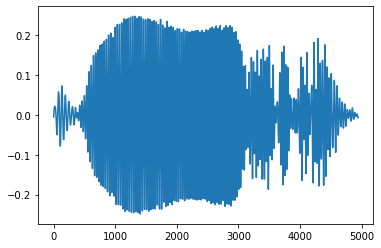

In [32]:
plt.plot(audio)
IPython.display.Audio(data=audio, rate=rate)

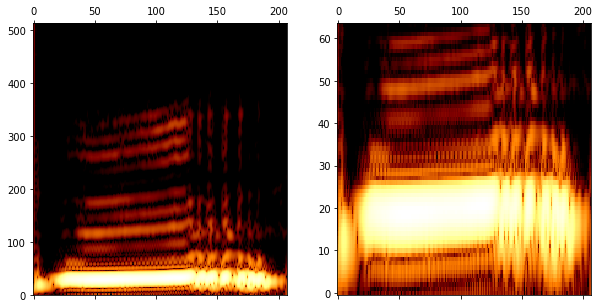

In [33]:
fig, axs = plt.subplots(ncols = 2, figsize=(10,5))
axs[0].matshow(spectrogram, origin='lower', aspect='auto', cmap = plt.cm.afmhot)
axs[1].matshow(mel_spec, origin='lower', aspect='auto', cmap = plt.cm.afmhot)

In [0]:
from PIL import Image 
def log_resize_spec(spec, spec_len_mul=20, freq_bins = 64):
    resize_shape = [int(np.log(np.shape(spec)[1])*spec_len_mul), freq_bins]
    resize_spec = np.array(Image.fromarray(spec).resize(resize_shape, Image.ANTIALIAS))
    return resize_spec

def pad_spectrogram(spectrogram, pad_length):
    """ Pads a spectrogram to being a certain length
    """
    excess_needed = pad_length - np.shape(spectrogram)[1]
    pad_left = np.floor(float(excess_needed) / 2).astype("int")
    pad_right = np.ceil(float(excess_needed) / 2).astype("int")
    return np.pad(
        spectrogram, [(0, 0), (pad_left, pad_right)], "constant", constant_values=0
    )

def make_spec(data, hparams):
    spectrogram = sg.spectrogram(data, rate, hparams)
    #spectrogram = mask_spec(spectrogram)
    spectrogram = spectrogram/np.max(spectrogram)
    #return spectrogram
    mel_spec = np.dot(spectrogram.T, mel_matrix).T
    #mel_spec = mask_spec(mel_spec)
    mel_spec = log_resize_spec(mel_spec)
    mel_spec[mel_spec<0] = 0
    mel_spec = mel_spec/np.max(mel_spec)
    mel_spec = (mel_spec * 255).astype('uint8')
    return mel_spec

def mask_spec(spec, spec_thresh=.9, offset=1e-10):
    mask = spec >= (spec.max(axis=0,keepdims=1)*spec_thresh+offset)
    return spec*mask

In [0]:
spec = make_spec(int16_to_float32(wav_df[wav_df.indv == 'SN'].vocdata.values[0]), hparams)

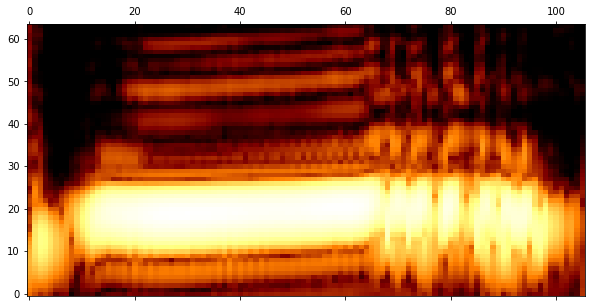

In [38]:
fig, ax = plt.subplots(ncols = 1, figsize=(10,5))
ax.matshow(spec, origin='lower', aspect='auto', cmap = plt.cm.afmhot)

In [0]:
from joblib import Parallel, delayed

In [46]:
%%time

specs = [make_spec(int16_to_float32(row.vocdata), hparams) for idx, row in wav_df.iterrows()]

CPU times: user 4min 9s, sys: 7min 7s, total: 11min 17s
Wall time: 2min 49s


In [0]:
spec_lens = np.array([np.shape(i)[1] for i in specs])

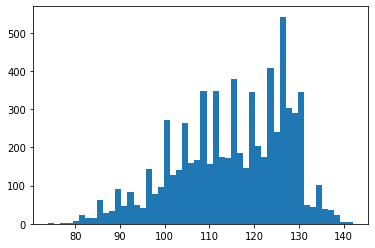

In [48]:
plt.hist(spec_lens, bins=50);

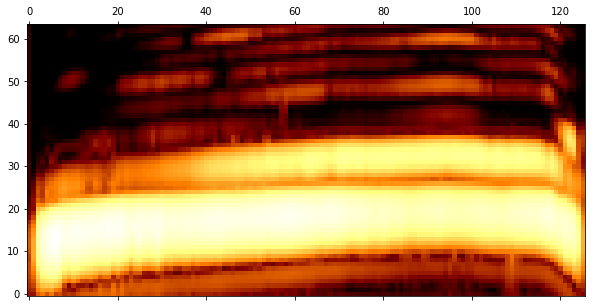

In [49]:
fig, ax = plt.subplots(ncols = 1, figsize=(10,5))
ax.matshow(specs[0], origin='lower', aspect='auto', cmap = plt.cm.afmhot)

In [0]:
def pad_spectrogram(spectrogram, pad_length):
    """ Pads a spectrogram to being a certain length
    """
    excess_needed = pad_length - np.shape(spectrogram)[1]
    pad_left = np.floor(float(excess_needed) / 2).astype("int")
    pad_right = np.ceil(float(excess_needed) / 2).astype("int")
    return np.pad(
        spectrogram, [(0, 0), (pad_left, pad_right)], "constant", constant_values=0
    )

In [0]:
specs_padded = [pad_spectrogram (spec, np.max(spec_lens)) for spec in specs]

In [0]:
wav_df['specs'] = specs_padded

In [0]:
spec = specs_padded[100]

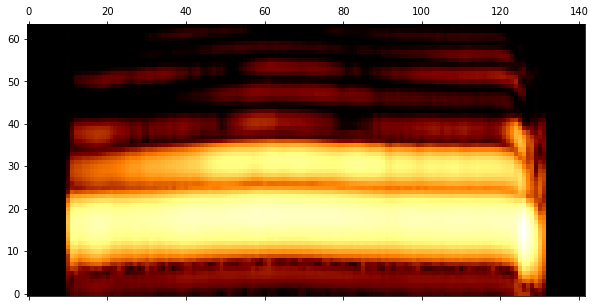

In [54]:
fig, ax = plt.subplots(ncols = 1, figsize=(10,5))
ax.matshow(spec, origin='lower', aspect='auto', cmap = plt.cm.afmhot)

In [55]:
total_indv_vocs = pd.DataFrame(
    {indv: [np.sum(wav_df.indv == indv)] for indv in np.unique(wav_df.indv)}
).T.sort_values(by=0, ascending=False).T
total_indv_vocs

,TH,MU,IO,SN,AL,QU,BE,TW
0,1167,1017,1002,1001,999,890,478,455


In [0]:
def plot_voc_canvas(specs_padded, nrow = 6, ncol = 20, zoom = 2):
    """
    """
    dimx = np.shape(specs_padded[0])[0]
    dimy = np.shape(specs_padded[0])[1]

    canvas = np.zeros((nrow*dimx, ncol*dimy))
    cn = 0
    for row in range(nrow)[::-1]:
        for col in range(ncol):
            canvas[dimx*row:dimx*(row+1), dimy*col:dimy*(col+1)] = specs_padded[cn]
            cn += 1

    fig, ax = plt.subplots(figsize=(ncol*zoom*2, nrow*zoom))
    ax.matshow(canvas, origin='lower', aspect='auto', cmap = plt.cm.afmhot)
    ax.axis('off')
    plt.show()

AL 999


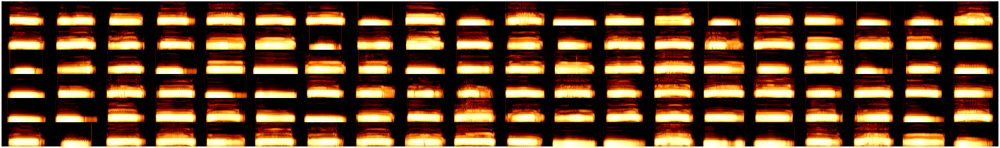

BE 478


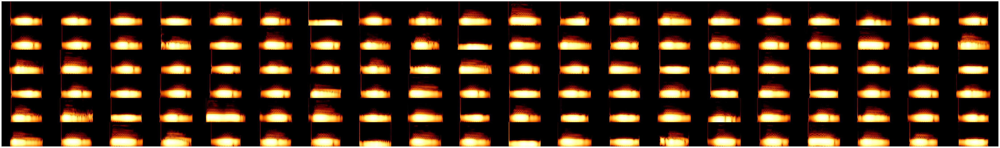

IO 1002


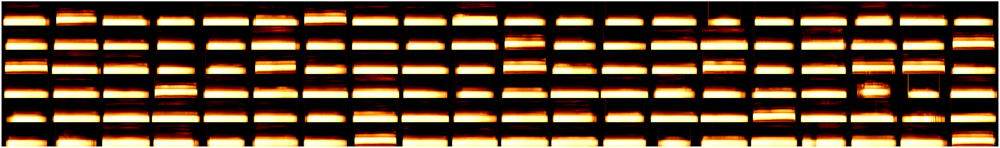

MU 1017


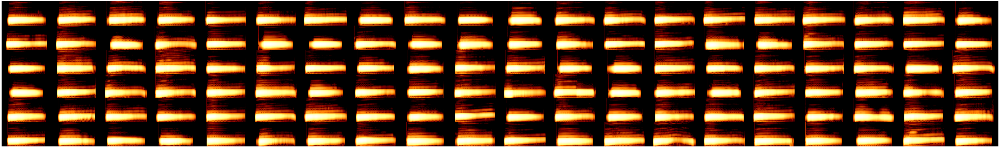

QU 890


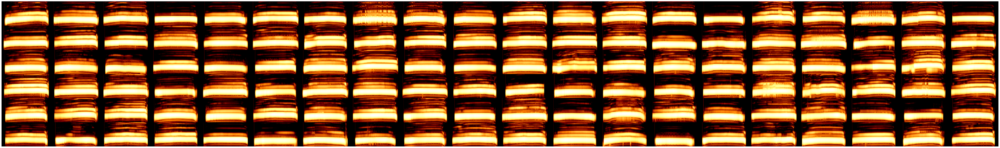

SN 1001


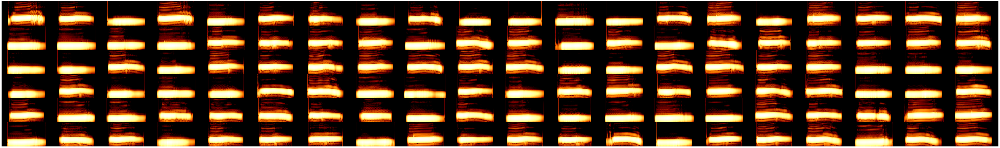

TH 1167


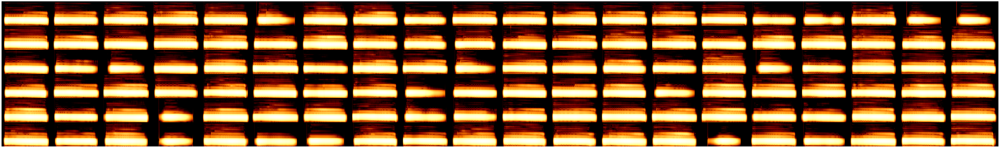

TW 455


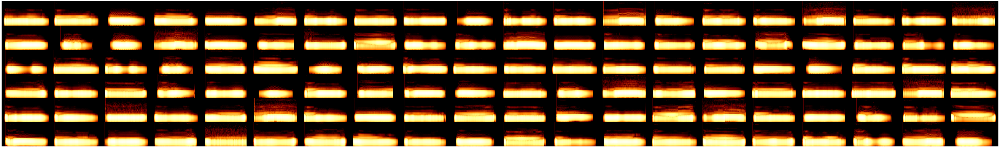

In [57]:
for indv in np.unique(wav_df.indv):
    indv_df = wav_df[
        (wav_df.indv == indv)
    ]
    print(indv, len(indv_df))
    plot_voc_canvas(indv_df.specs.values)

In [0]:
import umap
import seaborn as sns

In [59]:
specs = np.stack(wav_df.specs.values, axis=2).T
specs_flattened = np.reshape(specs, (np.shape(specs)[0], np.prod(np.shape(specs)[1:])))
len(specs_flattened)

7009

In [60]:
fit = umap.UMAP()
%time u_all = fit.fit_transform(specs_flattened)

/usr/local/lib/python3.6/dist-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../usr/local/lib/python3.6/dist-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/usr/local/lib/python3.6/dist-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../usr/local/lib/python3.6/dist-packages/umap/utils.py", line 409:
@numba.njit(paralle

CPU times: user 42.9 s, sys: 1.34 s, total: 44.3 s
Wall time: 43 s


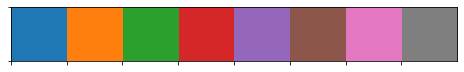

In [61]:
labs = wav_df.indv.values
pal = sns.color_palette(n_colors=len(np.unique(labs)))
sns.palplot(pal)
lab_dict = {lab:pal[i] for i, lab in enumerate(np.unique(labs))}
colors = np.array([lab_dict[i] for i in labs])

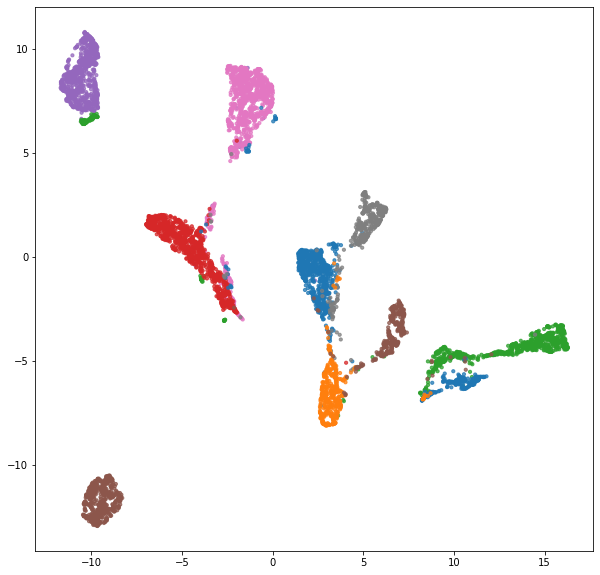

In [62]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(u_all[:,0], u_all[:,1], alpha = 0.75, s=10, color=colors)